## Body Performance Data Quick Exploration

The data I will be exploring is from [Kaggle](https://www.kaggle.com/datasets/kukuroo3/body-performance-data). The dataset contains certain health indicators and relates it to athletic performance. As a health enthusiast, I am curious to explore these relationships.

### How to start?

When I start analysing a new dataset, I like to use quick exploration or AutoEDA tools. This enables me to get a quick initial impression of my dataset and identify potential patterns by simple writing a few lines of code. 

This is a quick way to get some ideas for how I will explore my dataset or clean my dataset in further detail. For this exercise I used an extension of the pandas describe function, [Pandas Profiling](https://pypi.org/project/pandas-profiling/) and [Sweetviz](https://pypi.org/project/sweetviz/) but there are [many other options to choose from](https://medium.com/geekculture/10-automated-eda-libraries-at-one-place-ea5d4c162bbb).

## Exploratory data analysis

In [17]:
# import initial required packages
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [18]:
# load the data
df = pd.read_csv('../data/bodyPerformance.csv')

# sample of our dataset
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [19]:
# How many rows and cols
df.shape

(13393, 12)

In [10]:
# data info
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  object 
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  object 
dtypes: float64(10), object(2)
memory usage: 1.2+ MB


In [20]:
# count of nulls
df.isnull().sum()

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

In [21]:
# quick stats on numerical cols
df.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000
mean,36.775106,168.559807,67.447316,23.240165,78.796842,130.234817,36.963877,15.209268,39.771224,190.129627
std,13.625639,8.426583,11.949666,7.256844,10.742033,14.713954,10.624864,8.456677,14.276698,39.868000
min,21.000000,125.000000,26.300000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


## Quik EDA tool 1
### Datatile - an extension of the pandas describe function
This will enable us to extend the summary to non numeric columns by using the below.

In [38]:
# quick stats on all cols
from datatile.summary.df import DataFrameSummary
dfs = DataFrameSummary(df)
dfs.summary()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
count,13393.0,NaN,13393.0,13393.0,13393.0,13393.0,13393.0,13393.0,13393.0,13393.0,13393.0,NaN
mean,36.775106,NaN,168.559807,67.447316,23.240165,78.796842,130.234817,36.963877,15.209268,39.771224,190.129627,NaN
std,13.625639,NaN,8.426583,11.949666,7.256844,10.742033,14.713954,10.624864,8.456677,14.276698,39.868,NaN
min,21.0,NaN,125.0,26.3,3.0,0.0,0.0,0.0,-25.0,0.0,0.0,NaN
25%,25.0,NaN,162.4,58.2,18.0,71.0,120.0,27.5,10.9,30.0,162.0,NaN
50%,32.0,NaN,169.2,67.4,22.8,79.0,130.0,37.9,16.2,41.0,193.0,NaN
75%,48.0,NaN,174.8,75.3,28.0,86.0,141.0,45.2,20.7,50.0,221.0,NaN
max,64.0,NaN,193.8,138.1,78.4,156.2,201.0,70.5,213.0,80.0,303.0,NaN
counts,13393,13393,13393,13393,13393,13393,13393,13393,13393,13393,13393,13393
uniques,44,2,467,1398,527,89,102,550,528,81,245,4


It is clear that this dataset has no missing data. If you read the description on [Kaggle](https://www.kaggle.com/datasets/kukuroo3/body-performance-data), it is clear that the raw data was already cleaned by the owner. Depending on your use case you may want to use the original data or request more information on the transformations done on the dataset.

## Quik EDA tool 2
### Pandas profiling

It is often easier spot trends in data when the results are represented visually. For my first visual exploration I will use [Pandas Profiling](https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3).

Pro tip: Click 'More detail' under each Variable section.


In [43]:
from pandas_profiling import ProfileReport

In [46]:
#EDA using pandas-profiling
profile = ProfileReport(df,explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In a few minutes, I have learnt that:
- a large portion of the participants in the dataset are in their early 20s
- there were more males than females amongst the participants
- there are high correlations between the features in the dataset
- height seems to be approximately normally distributed
- the overall average height of participants was 168.6cm 

And that is is just to name a few!

In terms of data quality/cleaning, we already know that there are no missing data in this dataset, but the AutoEDA tool did identify a duplicate in the data!

## Quik EDA tool 2

I will now illustrate this using [Sweetviz](https://towardsdatascience.com/powerful-eda-exploratory-data-analysis-in-just-two-lines-of-code-using-sweetviz-6c943d32f34).

Pro tip: click on each column tile to see the expanded information.


In [12]:
import sweetviz as sv

                                             |          | [  0%]   00:00 -> (? left)


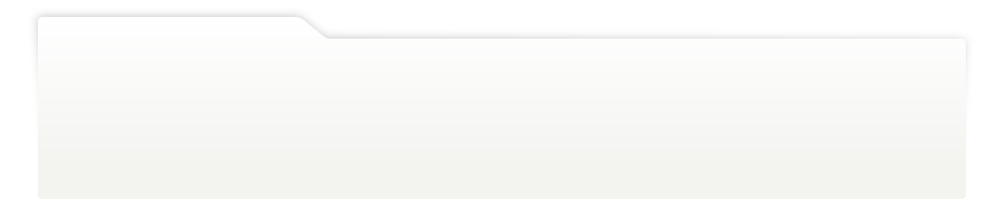
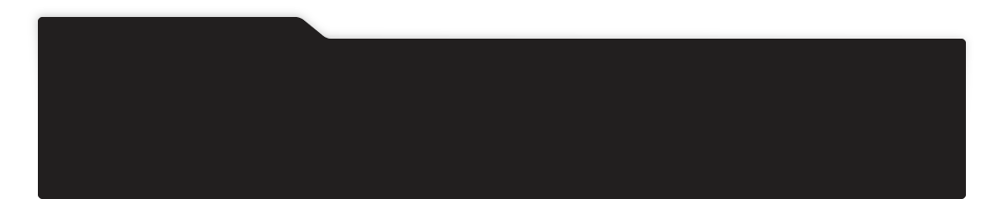
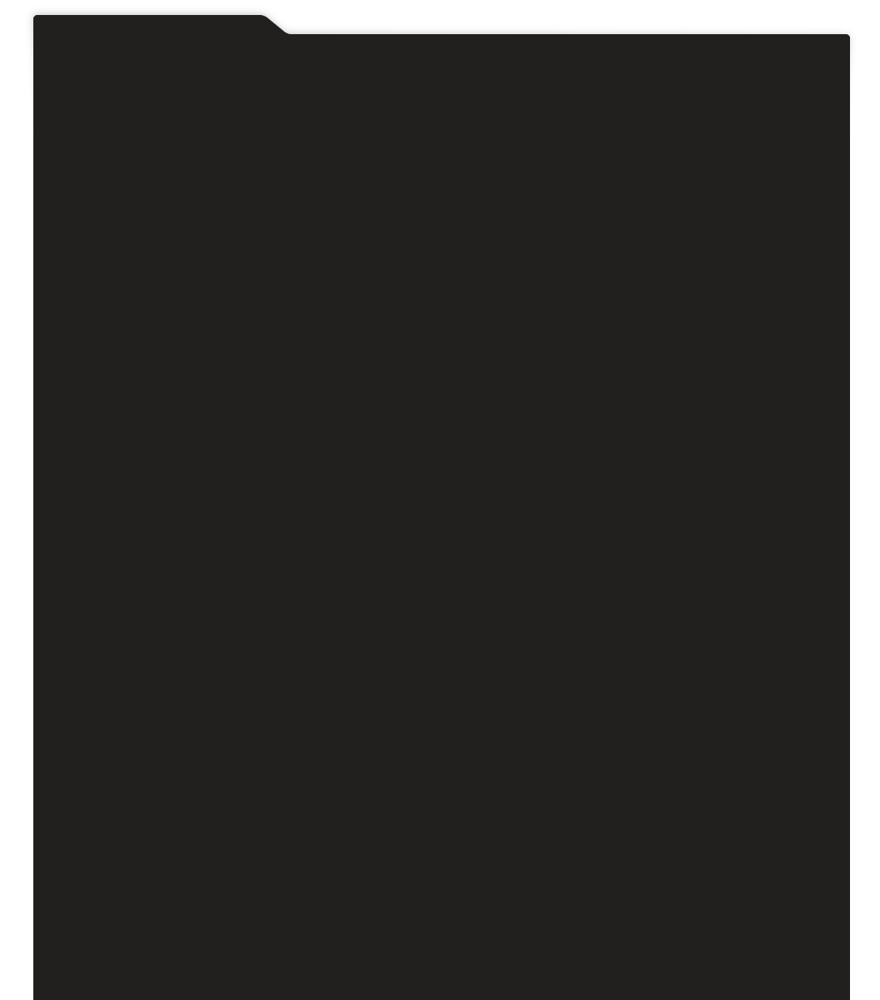
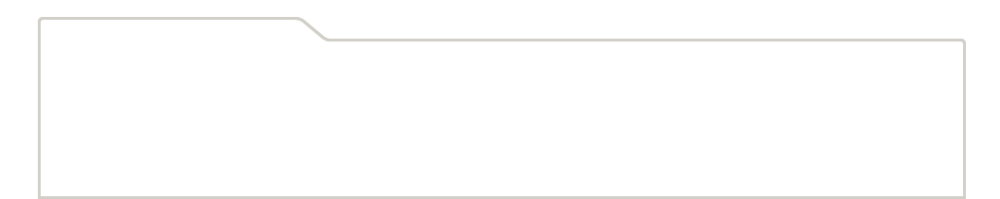
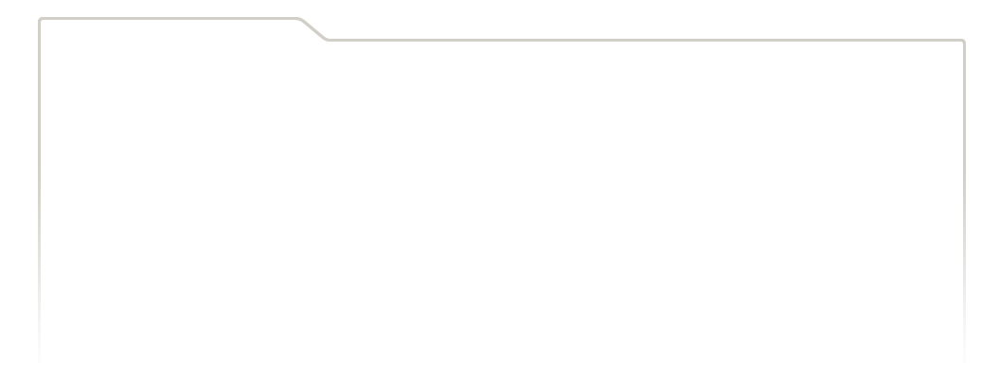
...
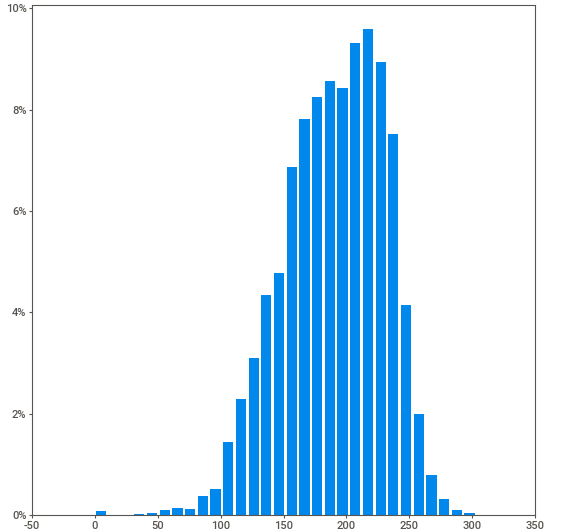
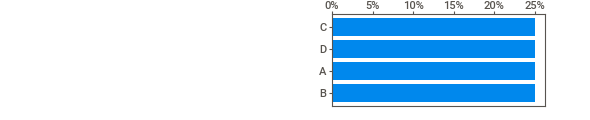
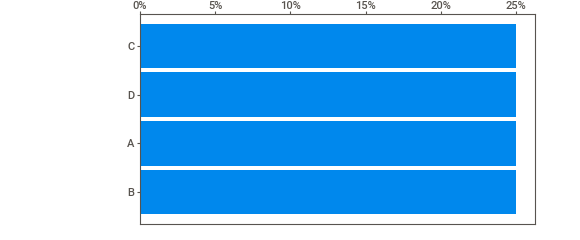
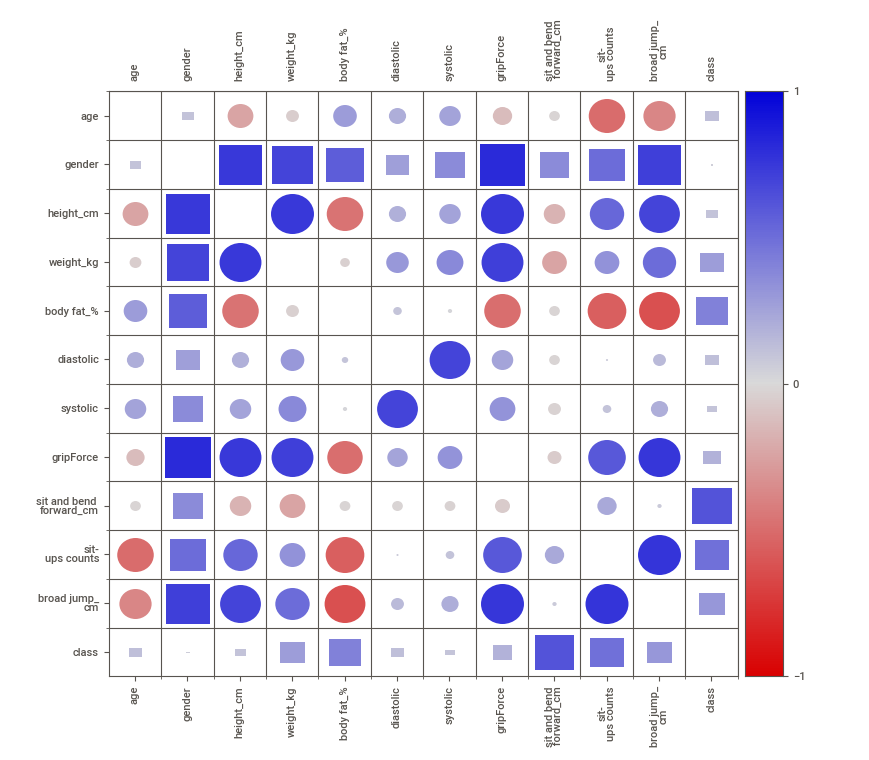
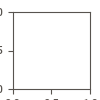

In [40]:
#EDA using Sweetoviz in two lines
sweetviz_report = sv.analyze(df)
sweetviz_report.show_notebook()

If you click on the 'Associations' tab, you will note that gender seems to be highly correlated to some of the other features. Out of interest I would like to split this quick analysis between the two available genders.

Sweetviz is a great tool for this as it enables you to compare two datasets by treating one as 'training' data and the other as 'testing' data.

In [49]:
df.gender.value_counts()

M    8467
F    4926
Name: gender, dtype: int64

In [50]:
# split the dataset
male_data = df[df.gender == "M"]
female_data = df[df.gender == "F"]

                                             |          | [  0%]   00:00 -> (? left)


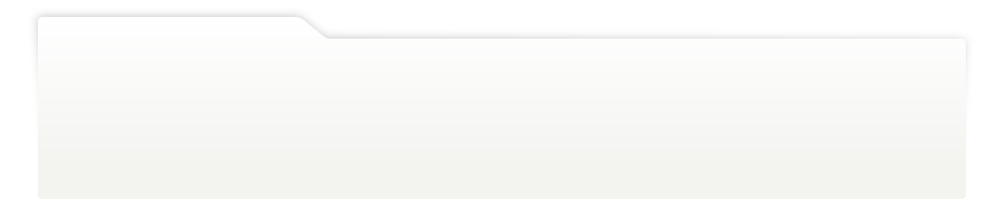
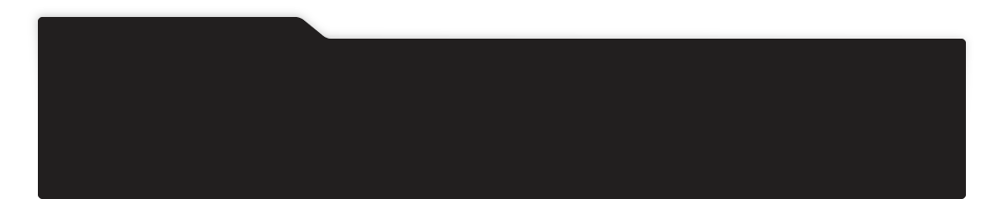
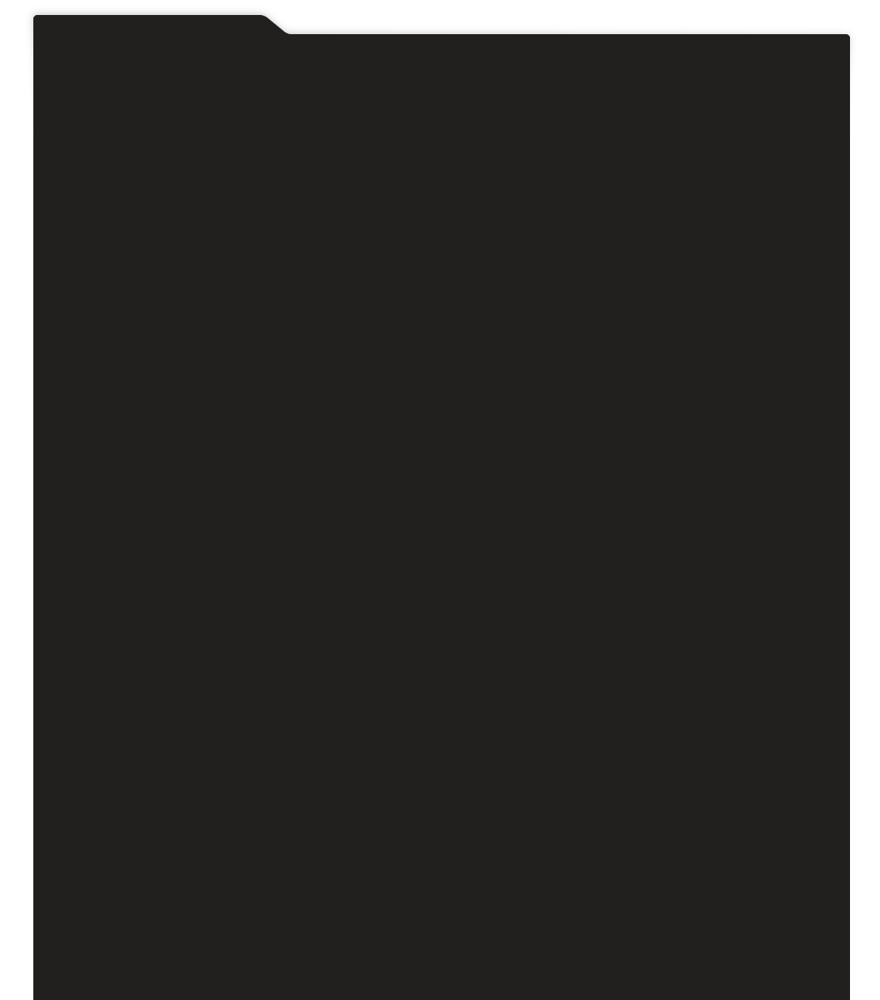
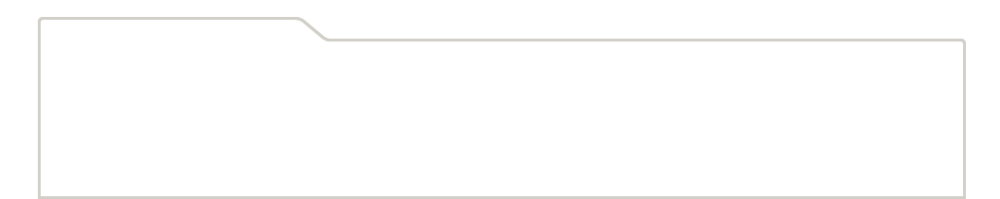
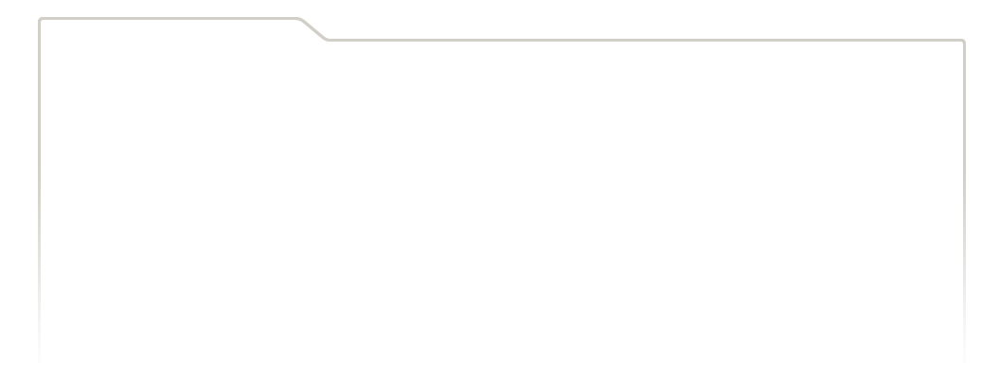
...
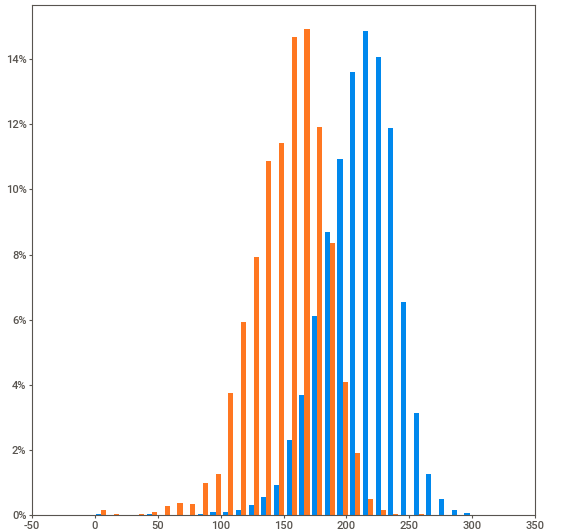
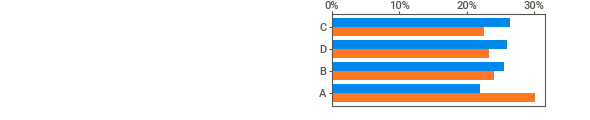
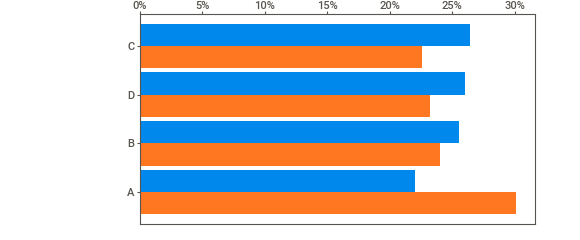
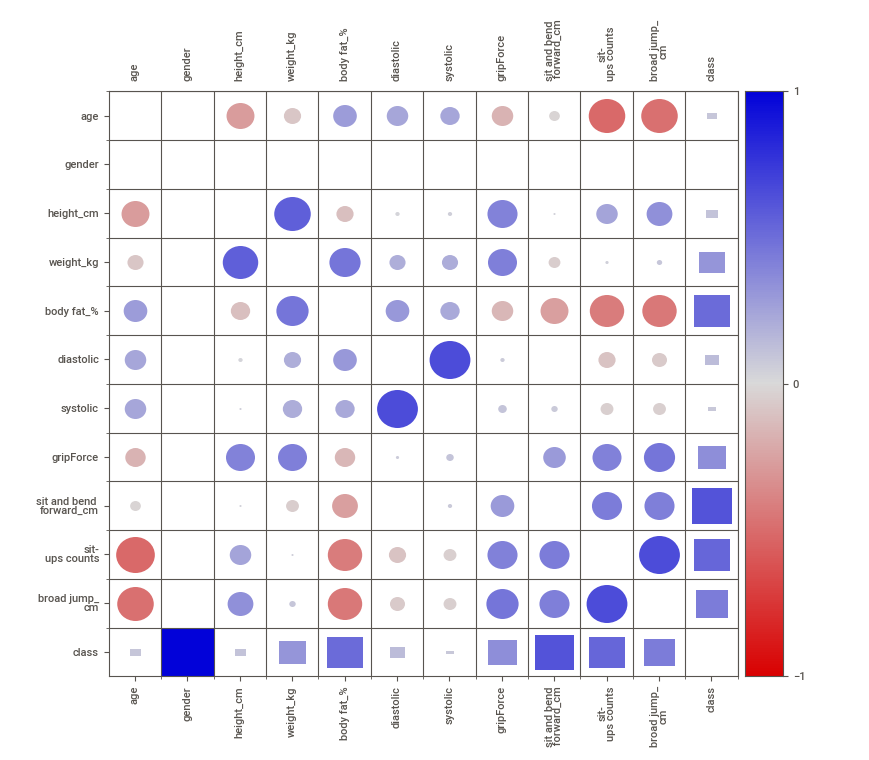
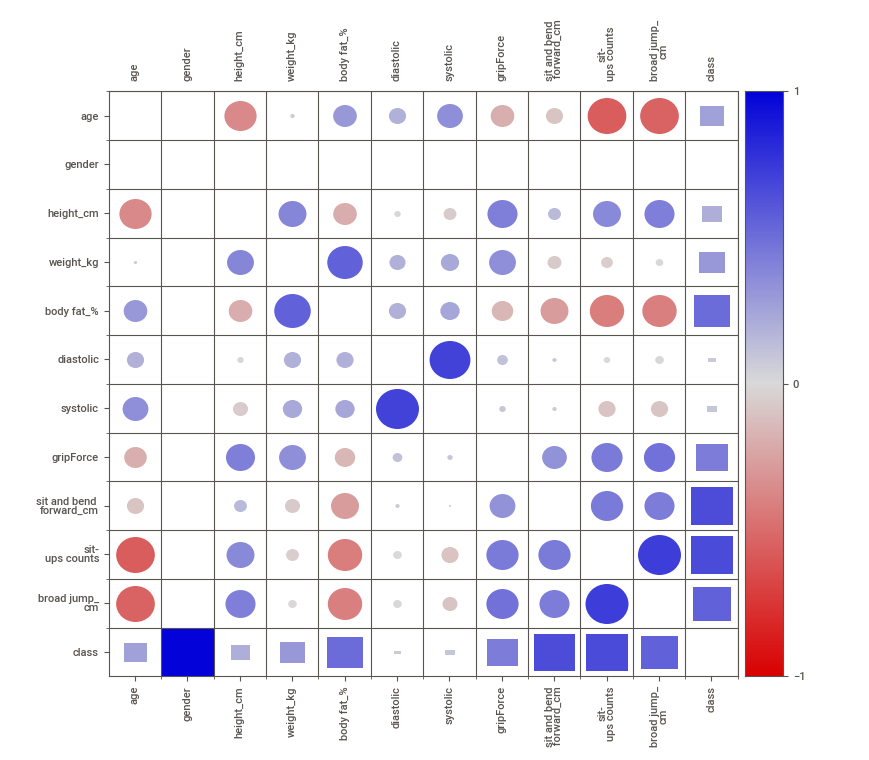

In [52]:
sweetviz_comparison_report = sv.compare([male_data, "Male"], [female_data, "Female"])
sweetviz_comparison_report.show_notebook()

By quick visual analysis, there are interesting things about to see about the participants here:
- Males seem to be taller and heavier that females
- Body fat seems to be lower for males
- Blood pressure doesn't seem to differ that much between the genders
And many more quick findings. 

It is important to note that these AUtoEDA findings are just the start to get us going. Now that we have gained some initial insight into our data, let's get our hands [dirty](1_BodyPerformanceAnalysis.ipynb).

